In [1]:
import sys, os
from pathlib import Path
sys.path.insert(0, str(Path(os.getcwd()).parent)) # add parent directory to path to import python files from there 

import segmentation_helper
import plotting
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

## Predict masks for dataset

Predictions are made with every model in `MOD_DIR` for any image of a specific format (default= jpg) in the `PATH` directory.   
- `PATH` can contain sub-directories named 'train', 'test'; alternatively setting `do_subfolders=True` allows to use any existing subfolder.
- Images with 'flow','flows','masks'or 'mask' in the file name will be ignored.
- Mask will be stored by default as tif files. 

In [2]:
#set the path to the folder that contains the images to be segmented
PATH = ["F:/cellpose/fh/"]
#set the path to the folder that contains the trained model(s)
MOD_DIR = "F:/cellpose/fh/train/models/"

In [3]:
#run the segmentation
all_results = segmentation_helper.batch_predict(MOD_DIR,PATH,mute=True,return_results=True)

cellpose_residual_on_style_on_concatenation_off_train_2023_01_11_15_39_03 found...


F:/cellpose/fh//train/: 100%|██████████| 6/6 [00:20<00:00,  3.35s/image]


fh found...


F:/cellpose/fh//train/: 100%|██████████| 6/6 [00:21<00:00,  3.54s/image]


fh_boosted found...


F:/cellpose/fh//train/: 100%|██████████| 6/6 [00:36<00:00,  6.14s/image]


fh_boosted_2 found...


F:/cellpose/fh//train/: 100%|██████████| 6/6 [00:21<00:00,  3.60s/image]


### Inspect segmentation in images

In [11]:
imgs,lbls,preds = segmentation_helper.dataset_loader(PATH,label_str='mask',pred_str='fh_pred')
_,_,preds_boosted = segmentation_helper.dataset_loader(PATH,label_str='mask',pred_str='fh_boosted_pred')
_,_,preds_boosted_2 = segmentation_helper.dataset_loader(PATH,label_str='mask',pred_str='fh_boosted_2')

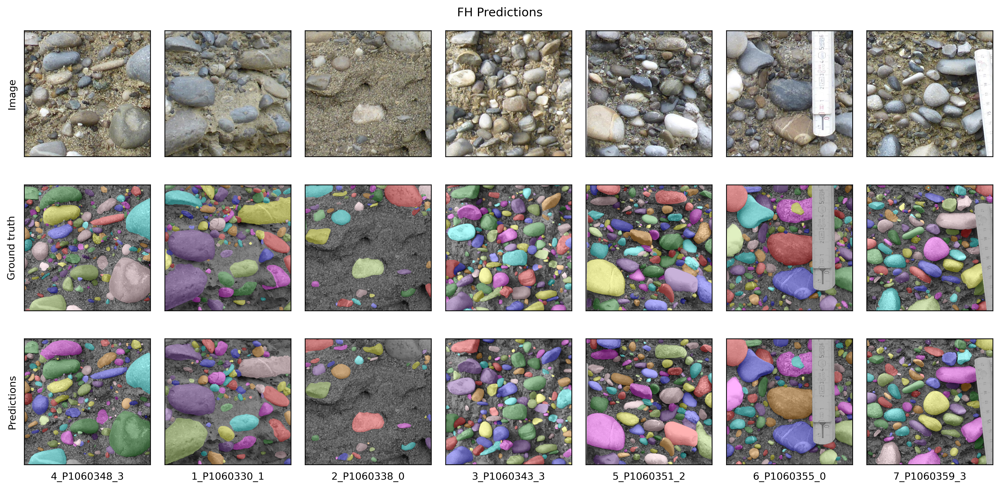

In [12]:
pred_plot = plotting.inspect_predictions(imgs,lbls,preds,title='FH Predictions')

## Evaluate segmentation performance

In [13]:
filters={'edge':[True,.05],'px_cutoff':[True,10]}

In [14]:
#eval mAP @ IoU
eval_results = segmentation_helper.eval_set(imgs,lbls,preds,dataID='FH',filters=filters)
eval_results_boosted = segmentation_helper.eval_set(imgs,lbls,preds_boosted,dataID='FH_boosted',filters=filters)
eval_results_boosted_2 = segmentation_helper.eval_set(imgs,lbls,preds_boosted,dataID='FH_boosted_2',filters=filters)

### Plot segmentation performance

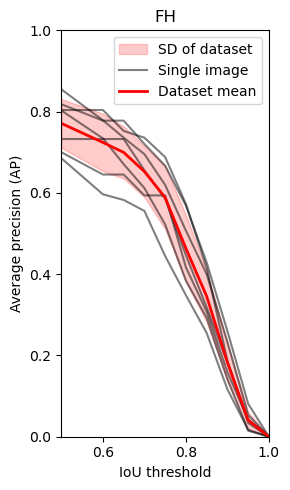

In [18]:
plotting.AP_IoU_plot(eval_results,title='FH');

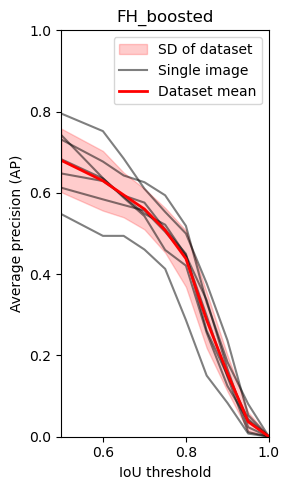

In [19]:
plotting.AP_IoU_plot(eval_results_boosted,title='FH_boosted');

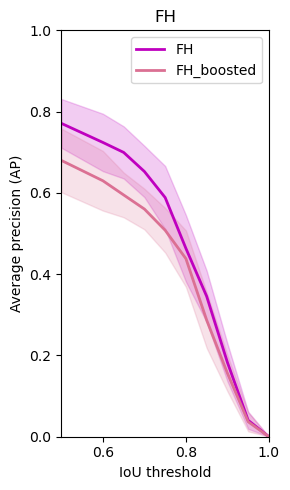

In [20]:
elem = {
    'dataset':'FH',
    'model_ID':['FH','FH_boosted'],
    'colors':['m','palevioletred'],
    'images':False,
    'SD':True,
    'avg_model':True
    }

plt.figure(figsize=(3,5))
plotting.AP_IoU_summary_plot([eval_results,eval_results_boosted],elem);